<a href="https://colab.research.google.com/github/SubhasriiT/CognoRise-Infotech/blob/main/Internship_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

In [ ]:
# !pip install pandas_profiling
# !pip install ydata_profiling
# !pip install missingno
# %pip install --user kneed
# %pip install --user plotly
# !conda install -c plotly plotly
# !pip install ipywidgets
import warnings
warnings.filterwarnings("ignore")
warnings.simplefilter("ignore")

%matplotlib inline
import numpy as np
import missingno as msno
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import ydata_profiling
import plotly.express as px
import plotly.graph_objects as go

from yellowbrick.cluster import KElbowVisualizer
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
from ydata_profiling import ProfileReport
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from yellowbrick.cluster import SilhouetteVisualizer
from sklearn.metrics import silhouette_score as sil_score


  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 400.1/400.1 kB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 19.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 687.8/687.8 kB 36.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.4/105.4 kB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.3/43.3 kB 3.2 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=2d9b2edd8030434ed9ee46e15a175e1fb00c82c84450d0cc730c828357fb0699
  Stored in directory: /root/.cache/pip/wheels/8d/55/1a/19cd535375ed1ede0c996405ebffe34b196d78e2d9545723a2
Successfully built htmlmin


In [ ]:
# Load dataset and make DataFrame
df = pd.DataFrame(pd.read_csv('/content/Country-data.csv'))
df

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200
...,...,...,...,...,...,...,...,...,...,...
162,Vanuatu,29.2,46.6,5.25,52.7,2950,2.62,63.0,3.50,2970
163,Venezuela,17.1,28.5,4.91,17.6,16500,45.90,75.4,2.47,13500
164,Vietnam,23.3,72.0,6.84,80.2,4490,12.10,73.1,1.95,1310
165,Yemen,56.3,30.0,5.18,34.4,4480,23.60,67.5,4.67,1310


In [ ]:
# Pandas profiling
report = ProfileReport(df)
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 10/10 [00:00<00:00, 61.54it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
#  Display the top 5 observations of the dataset
df.head()

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200


In [ ]:
# Display the last 5 observations of the dataset
df.tail()

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
162,Vanuatu,29.2,46.6,5.25,52.7,2950,2.62,63.0,3.50,2970
163,Venezuela,17.1,28.5,4.91,17.6,16500,45.90,75.4,2.47,13500
164,Vietnam,23.3,72.0,6.84,80.2,4490,12.10,73.1,1.95,1310
165,Yemen,56.3,30.0,5.18,34.4,4480,23.60,67.5,4.67,1310
166,Zambia,83.1,37.0,5.89,30.9,3280,14.00,52.0,5.40,1460


In [ ]:
# Get the number of rows(samples)
n_rows = df.shape[0]

# Get the number of columns(featuers)
n_cols = df.shape[1]

# Print the number of rows and columns
print("The number of rows is: ", n_rows)
print("The number of columns is: ", n_cols)

The number of rows is:  167
The number of columns is:  10


In [ ]:
# Get information from dataframe
# info() helps to understand the data type and information about data
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 167 entries, 0 to 166
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   country     167 non-null    object 
 1   child_mort  167 non-null    float64
 2   exports     167 non-null    float64
 3   health      167 non-null    float64
 4   imports     167 non-null    float64
 5   income      167 non-null    int64  
 6   inflation   167 non-null    float64
 7   life_expec  167 non-null    float64
 8   total_fer   167 non-null    float64
 9   gdpp        167 non-null    int64  
dtypes: float64(7), int64(2), object(1)
memory usage: 13.2+ KB


In [ ]:
# Checking some information of data
def check_data(df):
    List = []
    columns = df.columns
    for cols in columns:
        null_val = df[cols].isnull().sum()  # Checking the null values
        unique_val = df[cols].nunique()  # Checking the unique values
        dtypes = df[cols].dtypes  # Cheking the type of features
        List.append([cols, null_val, unique_val, dtypes])
    df_check = pd.DataFrame(List)
    df_check.columns = ["columns", "null_val", "unique_val", "dtypes"]
    return df_check


check_data(df)

,columns,null_val,unique_val,dtypes
0,country,0,167,object
1,child_mort,0,139,float64
2,exports,0,147,float64
3,health,0,147,float64
4,imports,0,151,float64
5,income,0,156,int64
6,inflation,0,156,float64
7,life_expec,0,127,float64
8,total_fer,0,138,float64
9,gdpp,0,157,int64


<Axes: >

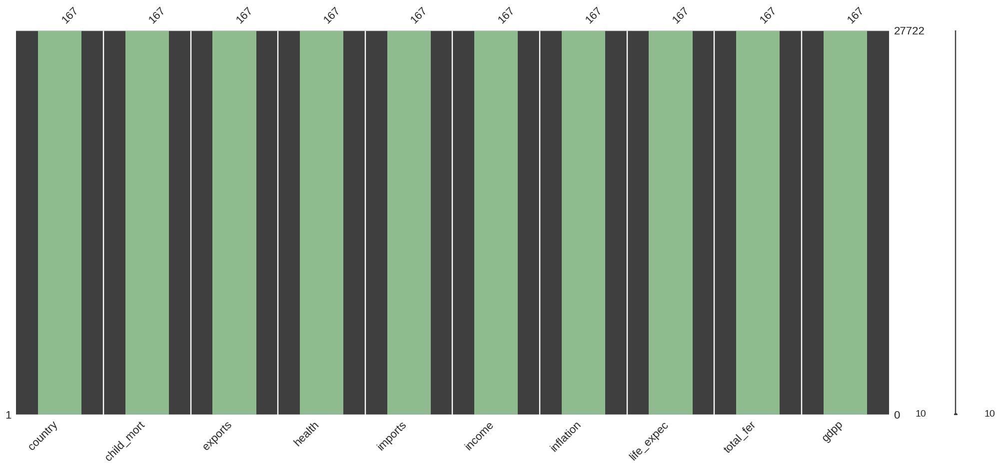

In [ ]:
# Checking the missing value
msno.matrix(df)
msno.bar(df, color="DarkSeaGreen")

In [ ]:
# Check for Duplication
print("The number of duplicated value in data:\n", df.duplicated().sum())

The number of duplicated value in data:
 0


In [ ]:
# Get a summary from dataframe
df.describe().T

,count,mean,std,min,25%,50%,75%,max
child_mort,167.0,38.270060,40.328931,2.6000,8.250,19.30,62.10,208.00
exports,167.0,41.108976,27.412010,0.1090,23.800,35.00,51.35,200.00
health,167.0,6.815689,2.746837,1.8100,4.920,6.32,8.60,17.90
imports,167.0,46.890215,24.209589,0.0659,30.200,43.30,58.75,174.00
income,167.0,17144.688623,19278.067698,609.0000,3355.000,9960.00,22800.00,125000.00
inflation,167.0,7.781832,10.570704,-4.2100,1.810,5.39,10.75,104.00
life_expec,167.0,70.555689,8.893172,32.1000,65.300,73.10,76.80,82.80
total_fer,167.0,2.947964,1.513848,1.1500,1.795,2.41,3.88,7.49
gdpp,167.0,12964.155689,18328.704809,231.0000,1330.000,4660.00,14050.00,105000.00


In [ ]:
df.describe(include="object").T

,count,unique,top,freq
country,167,167,Afghanistan,1


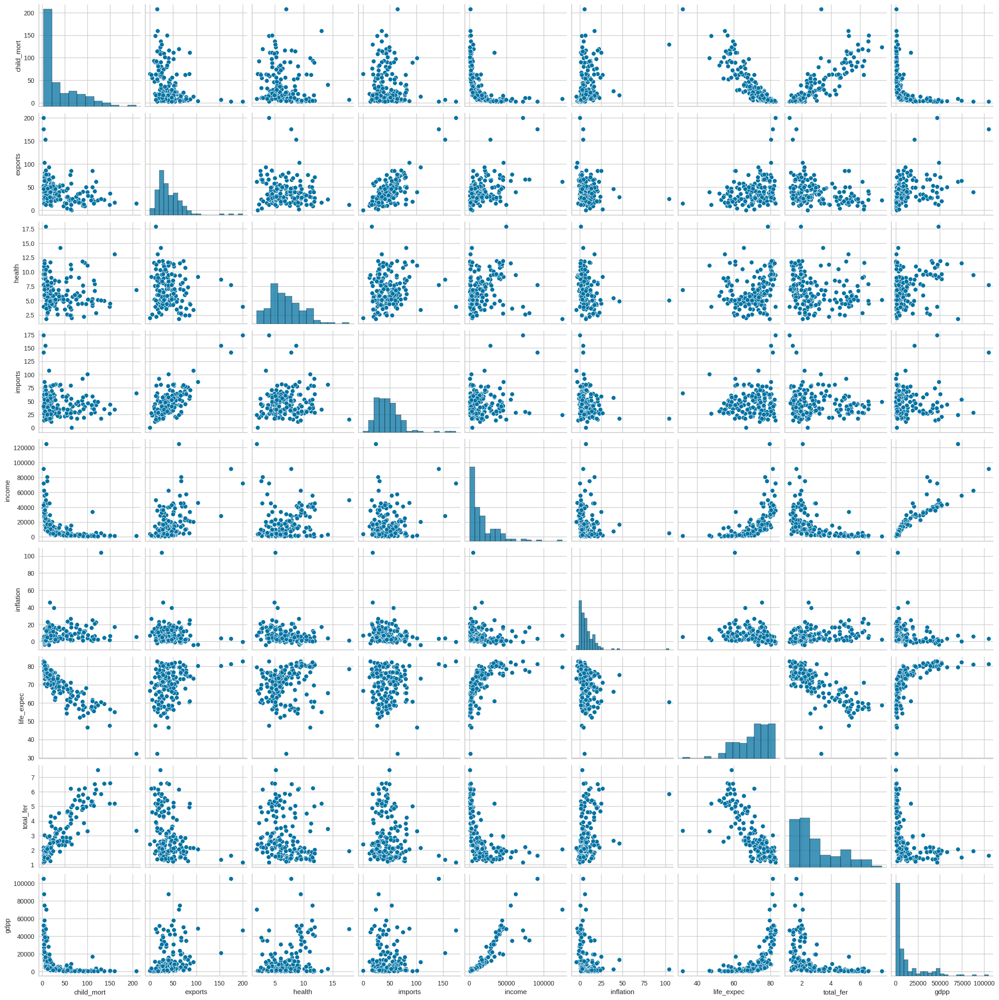

In [ ]:
# pair plot
sns.pairplot(data=df, palette="viridis")

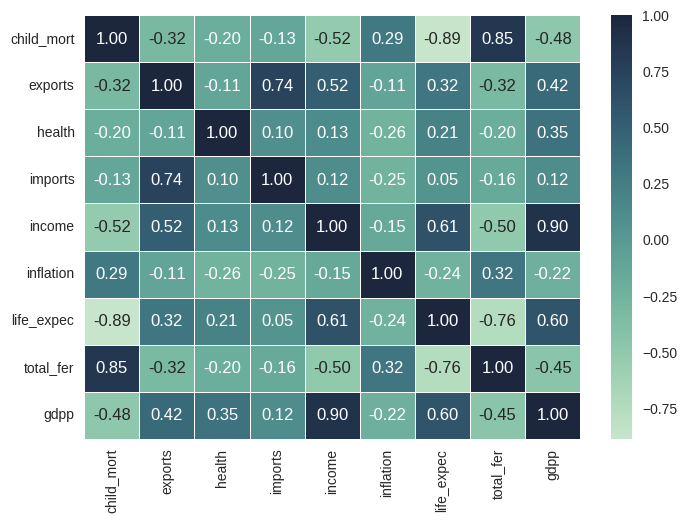

In [ ]:
# Create a heatmap of the DataFrame
sns.heatmap(df.drop(columns=["country"], axis=1).corr(), cmap=sns.cubehelix_palette(rot=-.4, as_cmap=True),
            annot=True, fmt=".2f", linewidth=.5)
plt.show()

In [ ]:
correlation = df.drop("country", axis=1).corr()
correlation

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
child_mort,1.000000,-0.318093,-0.200402,-0.127211,-0.524315,0.288276,-0.886676,0.848478,-0.483032
exports,-0.318093,1.000000,-0.114408,0.737381,0.516784,-0.107294,0.316313,-0.320011,0.418725
health,-0.200402,-0.114408,1.000000,0.095717,0.129579,-0.255376,0.210692,-0.196674,0.345966
imports,-0.127211,0.737381,0.095717,1.000000,0.122406,-0.246994,0.054391,-0.159048,0.115498
income,-0.524315,0.516784,0.129579,0.122406,1.000000,-0.147756,0.611962,-0.501840,0.895571
inflation,0.288276,-0.107294,-0.255376,-0.246994,-0.147756,1.000000,-0.239705,0.316921,-0.221631
life_expec,-0.886676,0.316313,0.210692,0.054391,0.611962,-0.239705,1.000000,-0.760875,0.600089
total_fer,0.848478,-0.320011,-0.196674,-0.159048,-0.501840,0.316921,-0.760875,1.000000,-0.454910
gdpp,-0.483032,0.418725,0.345966,0.115498,0.895571,-0.221631,0.600089,-0.454910,1.000000


In [ ]:
# Using the bar plot show 10 countries(in High and Low of each) in each feature
def barplots(Cols):

    fig = plt.subplots(nrows=1, ncols=3, figsize=(20,4))
    plt.subplot(1, 2, 1)
    ax = sns.barplot(x="country", y=Cols, data=df.sort_values(ascending=False, by=Cols).iloc[:10],
                     edgecolor="black", palette="viridis")
    plt.xlabel("country", color="DarkSalmon", fontsize=16, fontweight="bold")
    plt.ylabel(Cols, color="DarkSalmon", fontsize=16, fontweight="bold")
    plt.xticks(rotation=90, fontsize=12)
    plt.title("Top 10 Countries with high " + Cols, fontsize=20, fontweight="bold")

    plt.subplot(1,2,2)
    ax = sns.barplot(x="country", y=Cols, data=df.sort_values(ascending=False, by=Cols).iloc[157:],
                     edgecolor="black", palette="cubehelix")
    plt.xlabel("country", color="DarkSalmon", fontsize=16, fontweight="bold")
    plt.ylabel(Cols, color="DarkSalmon", fontsize=16, fontweight="bold")
    plt.xticks(rotation=90, fontsize=12)
    plt.title("Top 10 countries with low " + Cols, fontsize=20, fontweight="bold")

    plt.show()

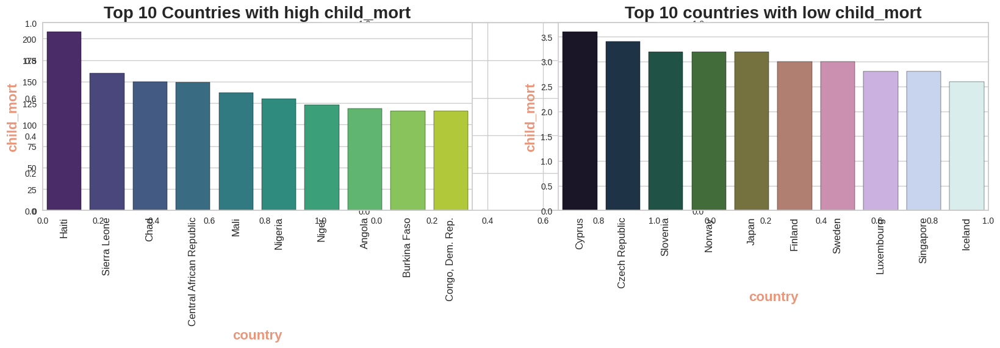

In [ ]:
barplots("child_mort")

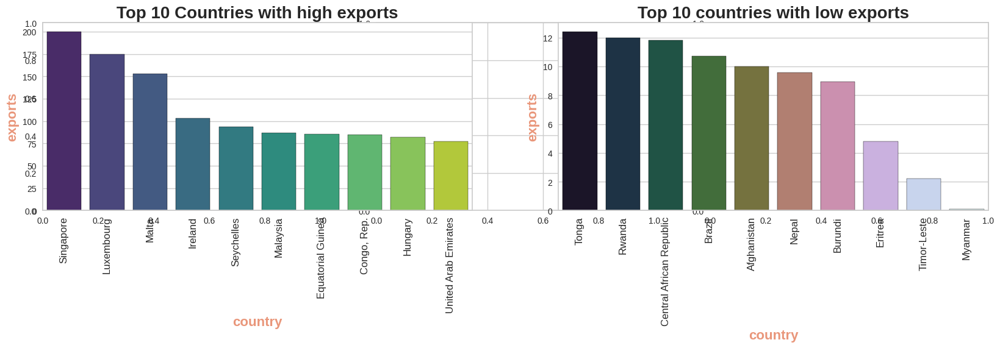

In [ ]:
barplots("exports")

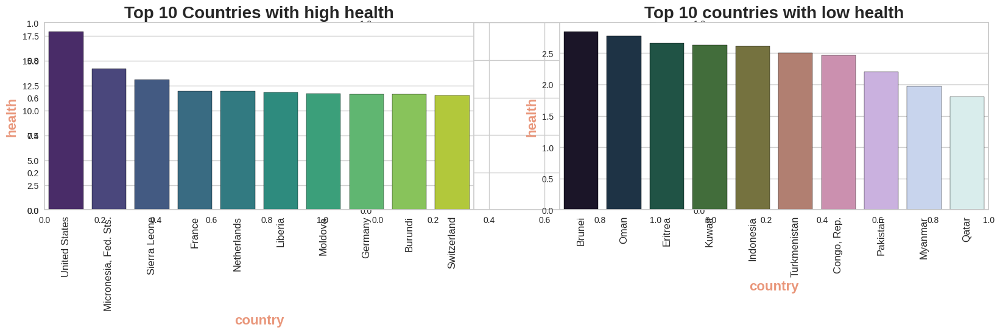

In [ ]:
barplots("health")

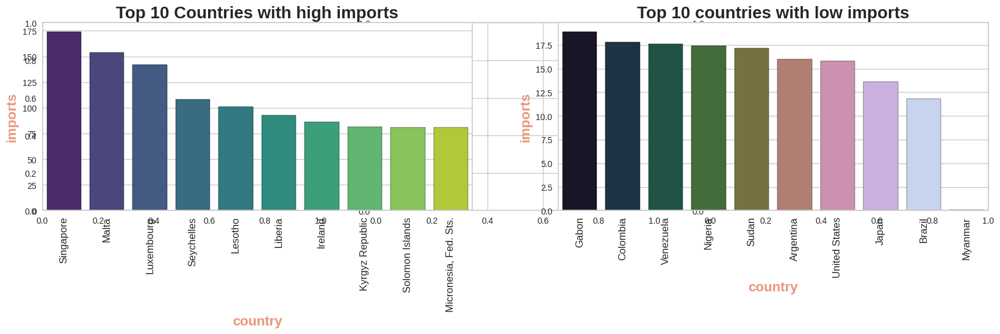

In [ ]:
barplots("imports")

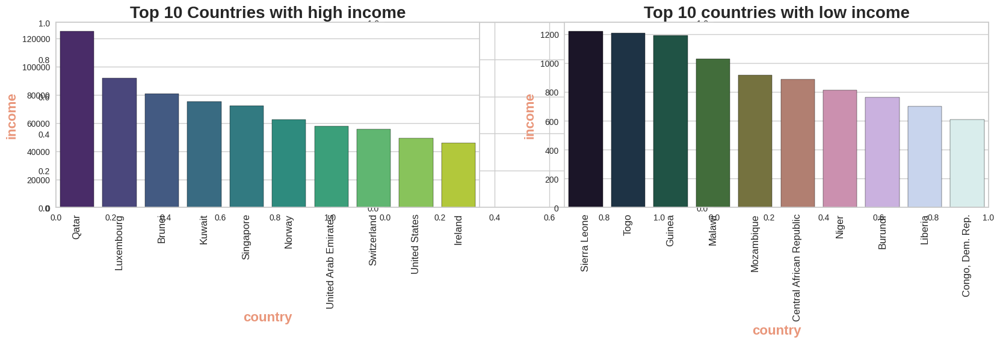

In [ ]:
barplots("income")

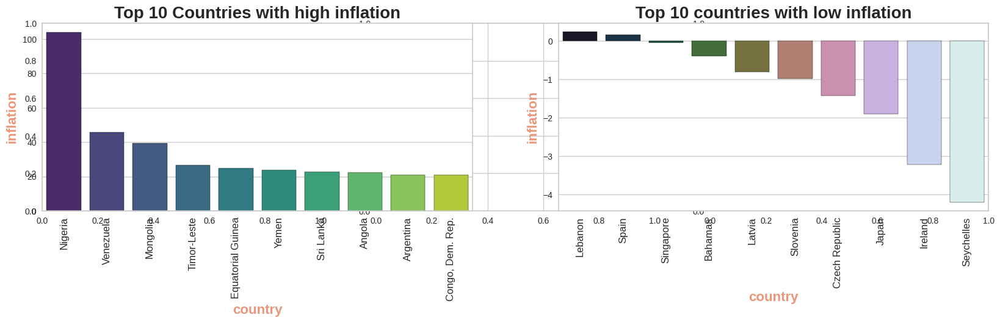

In [ ]:
barplots("inflation")

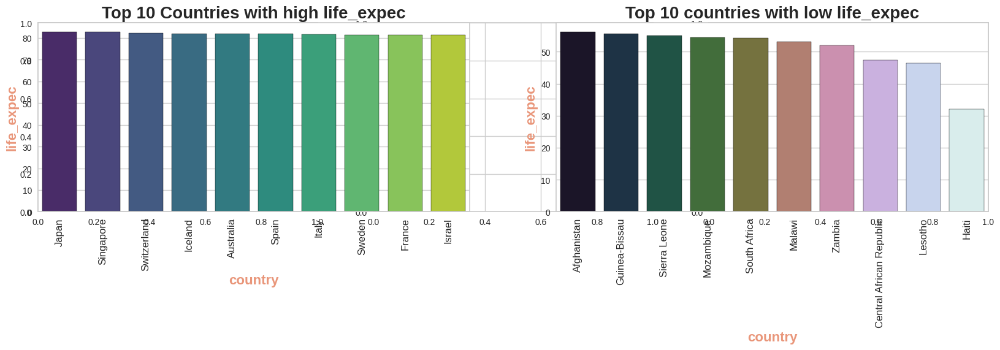

In [ ]:
barplots("life_expec")

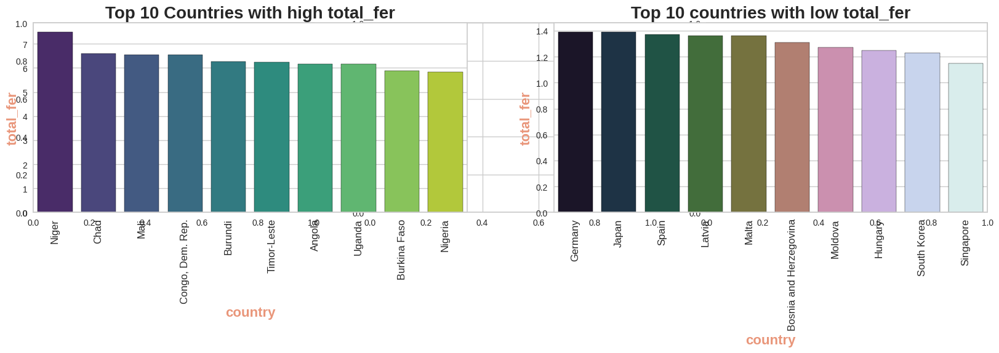

In [ ]:
barplots("total_fer")

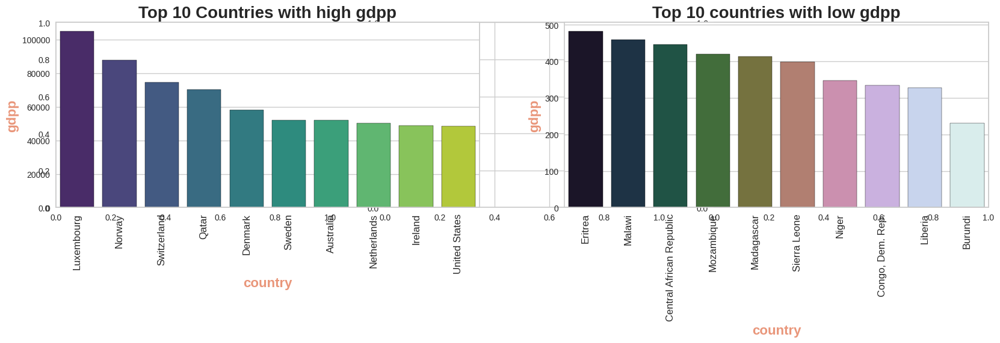

In [ ]:
barplots("gdpp")

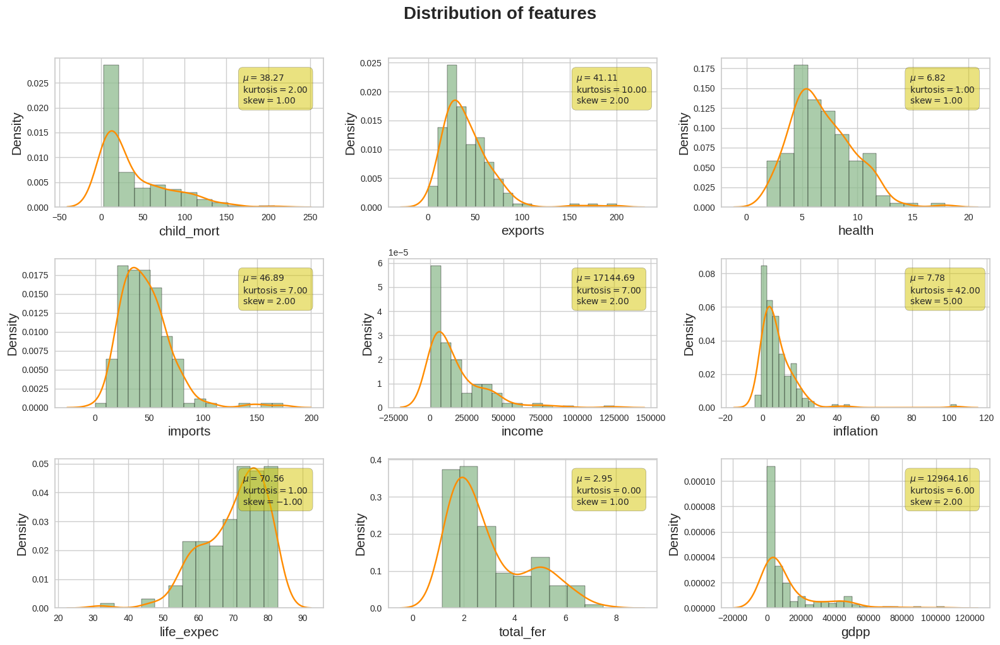

In [ ]:
# Checking distribution of features
coloumns = ["child_mort", "exports", "health", "imports", "income",
       "inflation", "life_expec", "total_fer", "gdpp"]

plt.figure(figsize=(16, 10))
for idx, col in enumerate(coloumns):
    ax = plt.subplot(3, 3, idx + 1)
    sns.histplot(x=col , data=df, stat="density", color="DarkSeaGreen")
    sns.kdeplot(x=col, data=df, color="DarkOrange")
    plt.xlabel(col, size=15,)
    plt.ylabel("Density", size=15)
    textstr = "\n".join((
    r"$\mu=%.2f$" %round(df[col].mean(), 2),
    r"$\mathrm{kurtosis}=%.2f$"%round(df[col].kurtosis()),
    r"$\mathrm{skew}=%.2f$" %round(df[col].skew()),
    ))
    ax.text(0.7, 0.90, textstr, transform=ax.transAxes, fontsize=10, verticalalignment="top",
                     bbox=dict(boxstyle="round",facecolor="y", edgecolor="black", pad=0.5, alpha=0.5))

plt.suptitle("Distribution of features", size=20, fontweight="bold", y=1.02)
plt.tight_layout()
plt.show()

child_mort
Skew : 1.45


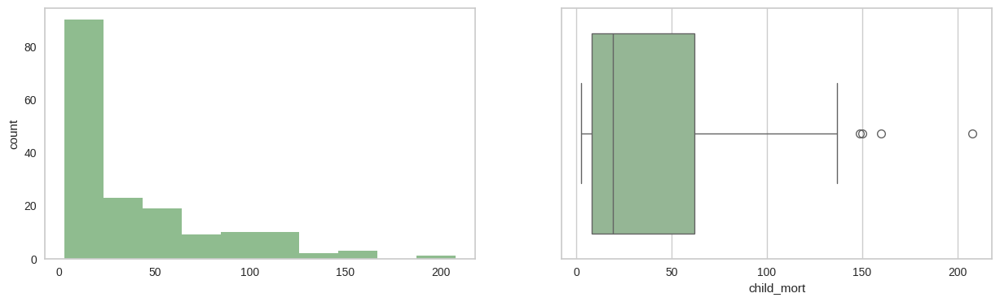

exports
Skew : 2.45


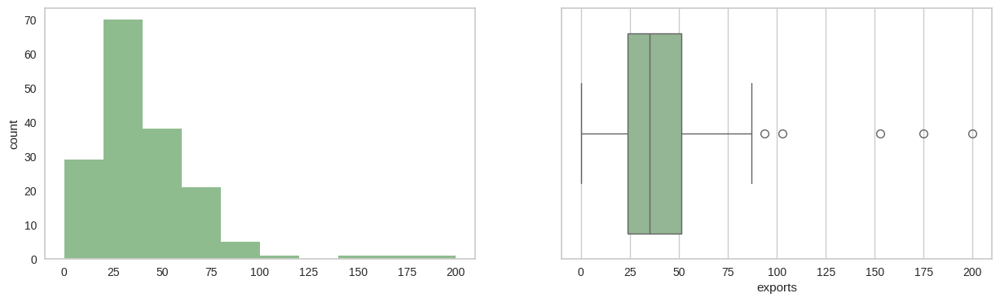

health
Skew : 0.71


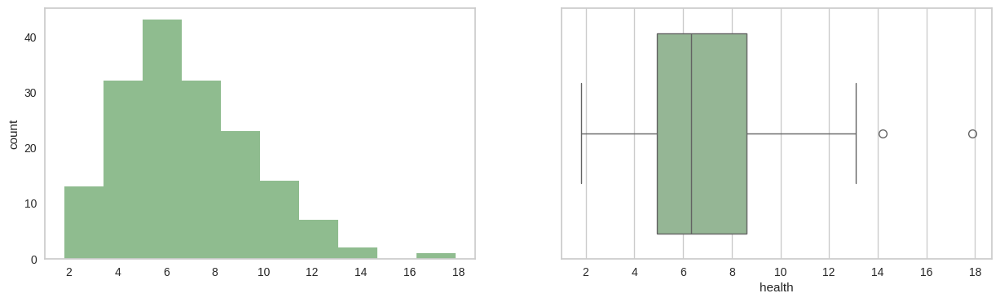

imports
Skew : 1.91


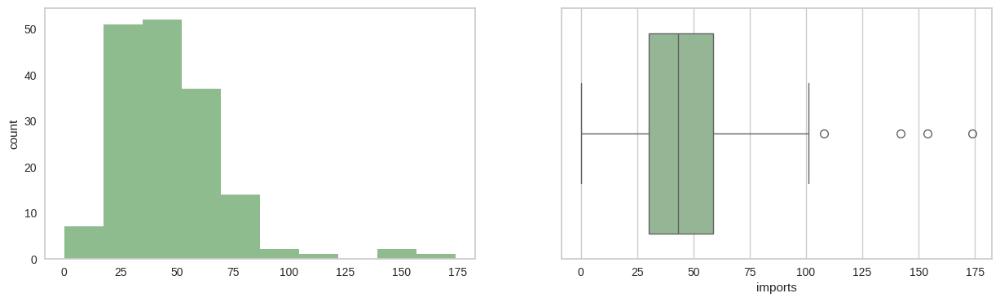

income
Skew : 2.23


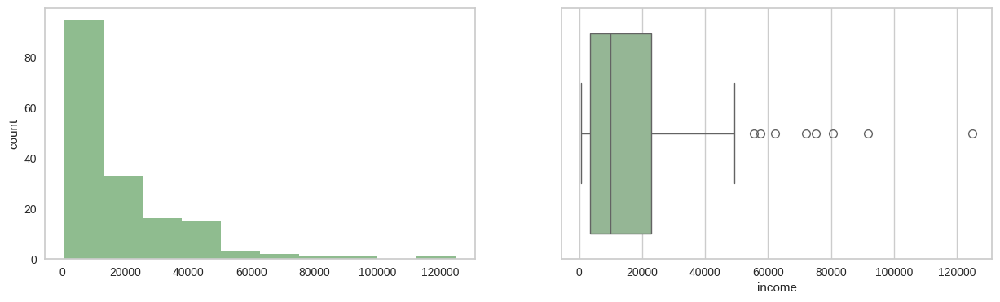

inflation
Skew : 5.15


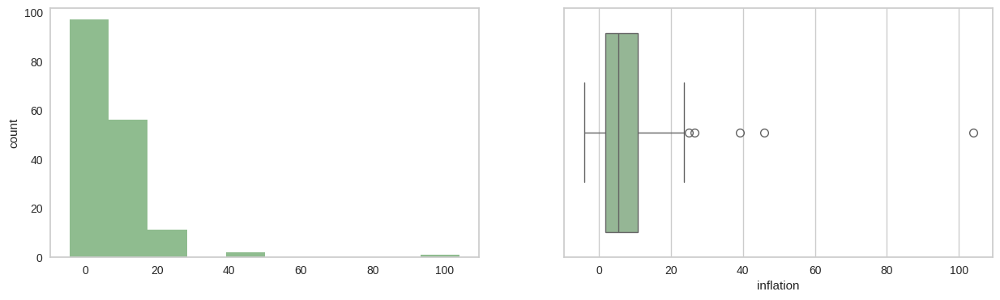

life_expec
Skew : -0.97


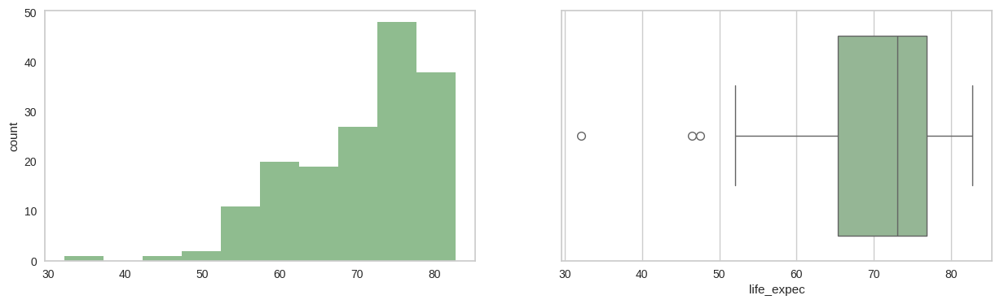

total_fer
Skew : 0.97


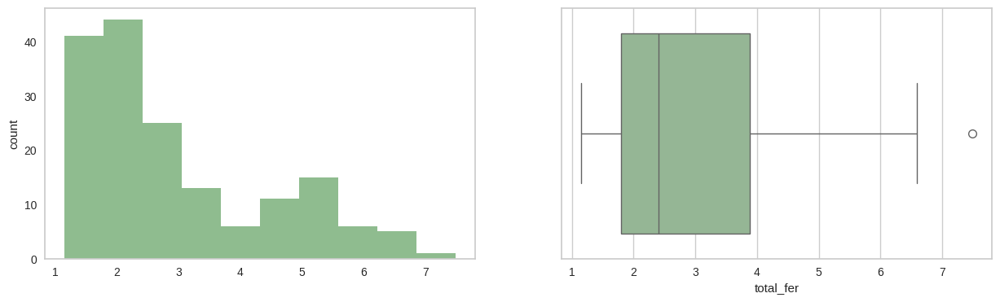

gdpp
Skew : 2.22


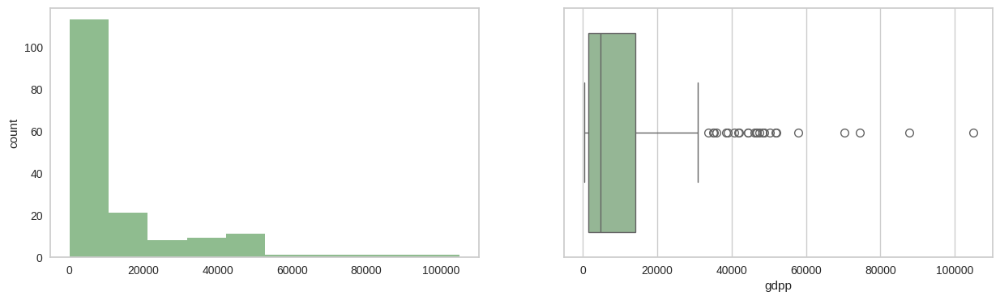

In [ ]:
# Using box plot to checking the outliers in dataset
features = ["child_mort", "exports", "health", "imports", "income",
       "inflation", "life_expec", "total_fer", "gdpp"]
for fea in features:
    print(fea)
    print("Skew :", round(df[fea].skew(), 2))
    plt.figure(figsize = (15, 4))
    plt.subplot(1, 2, 1)
    df[fea].hist(grid=False, color="DarkSeaGreen")
    plt.ylabel("count")
    plt.subplot(1, 2, 2)
    sns.boxplot(x=df[fea], color="DarkSeaGreen")
    plt.show()

In [ ]:
# Scatterplot
fig = px.scatter(df, x="child_mort", y="total_fer")
fig.update_layout(
        title="child_mort, total_fer scatter plot",
        xaxis={
            "showgrid": True,
            "rangeslider": {
                "visible": True,
                "thickness": 0.05
            }
        },
        yaxis={
            "showgrid": True
        },
        legend={
            "orientation": "v"
        },
        paper_bgcolor="#F0F8FF"
    )
fig.show(renderer="colab")

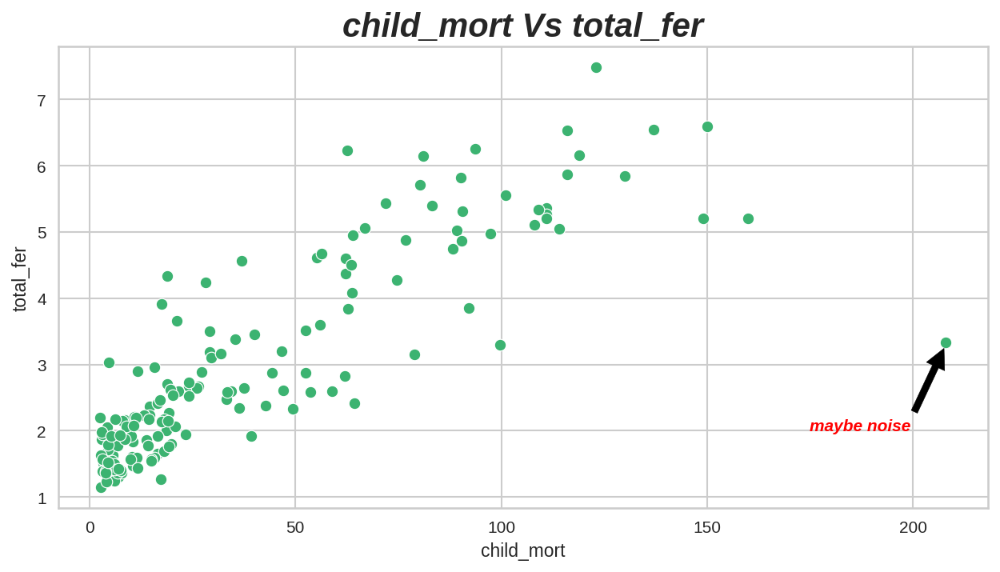

In [ ]:
plt.figure(figsize=(10,5), dpi=150)
sns.scatterplot(data=df, x="child_mort", y="total_fer", color="MediumSeaGreen")
plt.annotate("maybe noise", xy=(208,3.3),xytext=(175,2), arrowprops=dict(facecolor="black", shrink=0.05),fontsize=10,
            fontstyle = "oblique", color="red", fontweight="bold")
plt.xlabel("child_mort" )
plt.ylabel("total_fer")
plt.title("child_mort Vs total_fer", fontsize=20, fontstyle = "oblique", fontweight="bold")
plt.grid(True)
plt.show()

In [ ]:
fig = px.scatter(df, x="exports", y="imports")
fig.update_layout(
        title="exports, imports scatter plot",
        xaxis={
            "showgrid": True,
            "rangeslider": {
                "visible": True,
                "thickness": 0.05
            }
        },
        yaxis={
            "showgrid": True
        },
        legend={
            "orientation": "v"
        },
        paper_bgcolor="#F0F8FF"
    )
fig.show(renderer="colab")

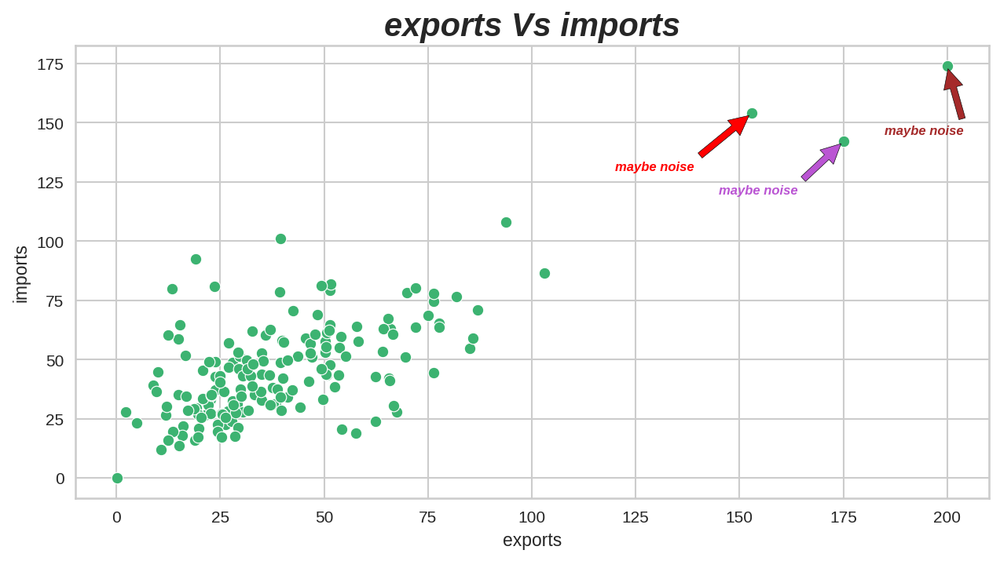

In [ ]:
plt.figure(figsize=(10,5), dpi=150)
sns.scatterplot(data=df, x="exports", y="imports", color="MediumSeaGreen")
plt.annotate("maybe noise", xy=(153,154),xytext=(120,130), arrowprops=dict(facecolor="red", shrink=0.05),fontsize=8,
            fontstyle = "oblique", color="red", fontweight="bold")
plt.annotate("maybe noise", xy=(175,142),xytext=(145,120), arrowprops=dict(facecolor="MediumOrchid", shrink=0.05),fontsize=8,
            fontstyle = "oblique", color="MediumOrchid", fontweight="bold")
plt.annotate("maybe noise", xy=(200, 174),xytext=(185,145), arrowprops=dict(facecolor="brown", shrink=0.05),fontsize=8,
            fontstyle = "oblique", color="brown", fontweight="bold")
plt.xlabel("exports")
plt.ylabel("imports")
plt.title("exports Vs imports", fontsize=20, fontstyle = "oblique", fontweight="bold")
plt.grid(True)
plt.show()

In [ ]:
fig = px.scatter(df, x="exports", y="income")
fig.update_layout(
        title="exports, income scatter plot",
        xaxis={
            "showgrid": True,
            "rangeslider": {
                "visible": True,
                "thickness": 0.05
            }
        },
        yaxis={
            "showgrid": True
        },
        legend={
            "orientation": "v"
        },
        paper_bgcolor="#F0F8FF"
    )
fig.show(renderer="colab")

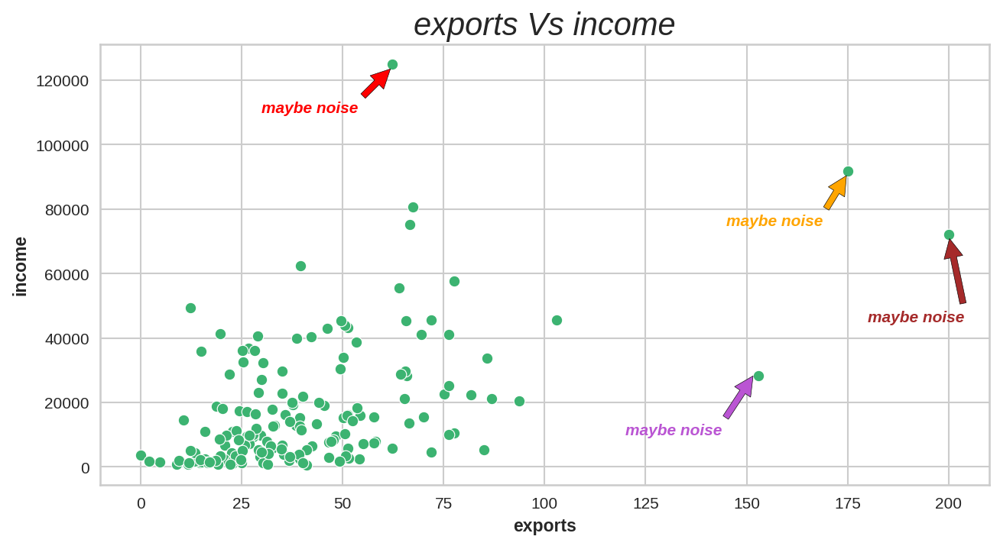

In [ ]:
plt.figure(figsize=(10,5), dpi=150)
sns.scatterplot(data=df, x="exports", y="income", color="MediumSeaGreen")
plt.annotate("maybe noise", xy=(62.3,124000),xytext=(30,110000), arrowprops=dict(facecolor="red", shrink=0.05),fontsize=10,
            fontstyle = "oblique", color="red", fontweight="bold")

plt.annotate("maybe noise", xy=(152,29000),xytext=(120,10000), arrowprops=dict(facecolor="MediumOrchid", shrink=0.05),fontsize=10,
            fontstyle = "oblique", color="MediumOrchid", fontweight="bold")

plt.annotate("maybe noise", xy=(175,91000),xytext=(145,75000), arrowprops=dict(facecolor="orange", shrink=0.05),fontsize=10,
            fontstyle = "oblique", color="orange", fontweight="bold")

plt.annotate("maybe noise", xy=(200,72000),xytext=(180,45000), arrowprops=dict(facecolor="brown", shrink=0.05),fontsize=10,
            fontstyle = "oblique", color="brown", fontweight="bold")

plt.xlabel("exports", fontweight="bold")
plt.ylabel("income", fontweight="bold")
plt.title("exports Vs income", fontsize=20, fontstyle = "oblique")
plt.grid(True)
plt.show()

In [ ]:
fig = px.scatter(df, x="income", y="gdpp")
fig.update_layout(
        title="income Vs. gdpp scatter plot",
        xaxis={
            "showgrid": True,
            "rangeslider": {
                "visible": True,
                "thickness": 0.05
            }
        },
        yaxis={
            "showgrid": True
        },
        legend={
            "orientation": "v"
        },
        paper_bgcolor="#F0F8FF"
    )
fig.show(renderer="colab")

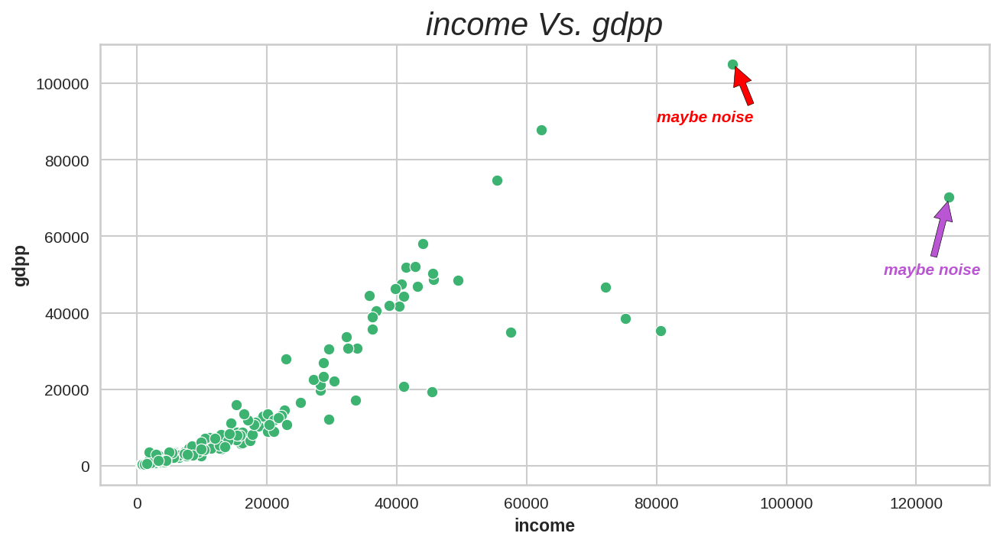

In [ ]:
plt.figure(figsize=(10,5), dpi=150)
sns.scatterplot(data=df, x="income", y="gdpp", color="MediumSeaGreen")
plt.annotate("maybe noise", xy=(92000,105000),xytext=(80000,90000), arrowprops=dict(facecolor="red", shrink=0.05),fontsize=10,
            fontstyle = "oblique", color="red", fontweight="bold")

plt.annotate("maybe noise", xy=(125000,70000),xytext=(115000,50000), arrowprops=dict(facecolor="MediumOrchid", shrink=0.05),fontsize=10,
            fontstyle = "oblique", color="MediumOrchid", fontweight="bold")


plt.xlabel("income", fontweight="bold")
plt.ylabel("gdpp", fontweight="bold")
plt.title("income Vs. gdpp", fontsize=20, fontstyle = "oblique")
plt.grid(True)
plt.show()

In [ ]:
fig = px.scatter(df, x="life_expec", y="gdpp")
fig.update_layout(
        title="life_expec Vs. gdpp scatter plot",
        xaxis={
            "showgrid": True,
            "rangeslider": {
                "visible": True,
                "thickness": 0.05
            }
        },
        yaxis={
            "showgrid": True
        },
        legend={
            "orientation": "v"
        },
        paper_bgcolor="#F0F8FF"
    )
fig.show(renderer="colab")

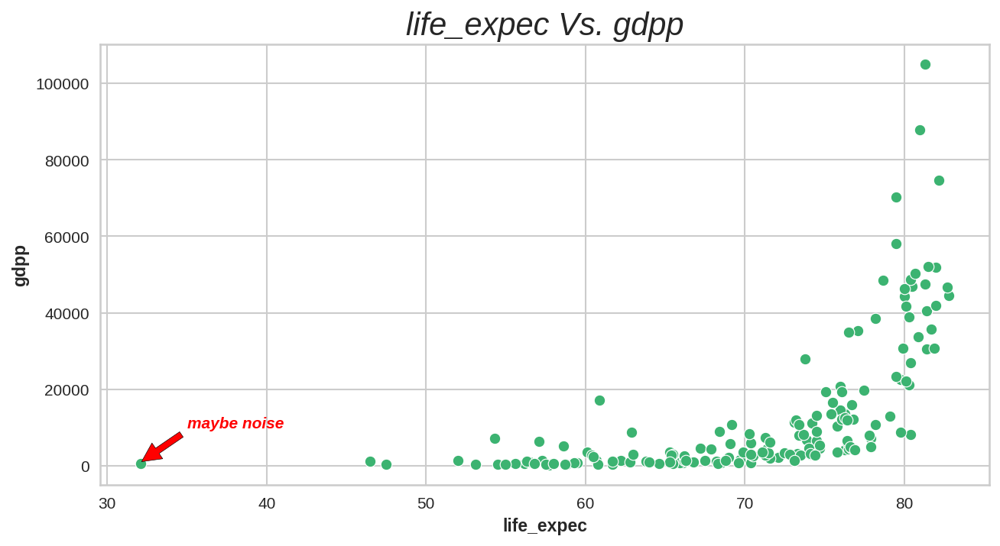

In [ ]:
plt.figure(figsize=(10,5), dpi=150)
sns.scatterplot(data=df, x="life_expec", y="gdpp", color="MediumSeaGreen")
plt.annotate("maybe noise", xy=(32,662),xytext=(35,10000), arrowprops=dict(facecolor="red", shrink=0.05),fontsize=10,
            fontstyle = "oblique", color="red", fontweight="bold")

plt.xlabel("life_expec", fontweight="bold")
plt.ylabel("gdpp", fontweight="bold")
plt.title("life_expec Vs. gdpp", fontsize=20, fontstyle = "oblique")
plt.grid(True)
plt.show()

In [ ]:
# Checking  the index of some points that "they are outliers maybe in scatter plots" we said.
columns=["child_mort", "exports", "health", "imports", "income", "inflation", "life_expec", "gdpp"]
for cols in columns:
    print(f"\n  Outliers points related to {cols}:\n")
    outliers = df[df[cols] > df[cols].quantile(0.95)]
    # Sorting by cols
    outliers = outliers.sort_values(by=cols, ascending=False)
    display(outliers)


  Outliers points related to child_mort:



,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
66,Haiti,208.0,15.3,6.91,64.7,1500,5.45,32.1,3.33,662
132,Sierra Leone,160.0,16.8,13.10,34.5,1220,17.20,55.0,5.20,399
32,Chad,150.0,36.8,4.53,43.5,1930,6.39,56.5,6.59,897
31,Central African Republic,149.0,11.8,3.98,26.5,888,2.01,47.5,5.21,446
97,Mali,137.0,22.8,4.98,35.1,1870,4.37,59.5,6.55,708
113,Nigeria,130.0,25.3,5.07,17.4,5150,104.00,60.5,5.84,2330
112,Niger,123.0,22.2,5.16,49.1,814,2.55,58.8,7.49,348
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530



  Outliers points related to exports:



,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
133,Singapore,2.8,200.0,3.96,174.0,72100,-0.046,82.7,1.15,46600
91,Luxembourg,2.8,175.0,7.77,142.0,91700,3.620,81.3,1.63,105000
98,Malta,6.8,153.0,8.65,154.0,28300,3.830,80.3,1.36,21100
73,Ireland,4.2,103.0,9.19,86.5,45700,-3.220,80.4,2.05,48700
131,Seychelles,14.4,93.8,3.40,108.0,20400,-4.210,73.4,2.17,10800
95,Malaysia,7.9,86.9,4.39,71.0,21100,7.270,74.5,2.15,9070
49,Equatorial Guinea,111.0,85.8,4.48,58.9,33700,24.900,60.9,5.21,17100
38,"Congo, Rep.",63.9,85.1,2.46,54.7,5190,20.700,60.4,4.95,2740
67,Hungary,6.0,81.8,7.33,76.5,22300,2.330,74.5,1.25,13100



  Outliers points related to health:



,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
159,United States,7.3,12.40,17.9,15.8,49400,1.220,78.7,1.93,48400
101,"Micronesia, Fed. Sts.",40.0,23.50,14.2,81.0,3340,3.800,65.4,3.46,2860
132,Sierra Leone,160.0,16.80,13.1,34.5,1220,17.200,55.0,5.20,399
110,Netherlands,4.5,72.00,11.9,63.6,45500,0.848,80.7,1.79,50300
54,France,4.2,26.80,11.9,28.1,36900,1.050,81.4,2.03,40600
88,Liberia,89.3,19.10,11.8,92.6,700,5.470,60.8,5.02,327
102,Moldova,17.2,39.20,11.7,78.5,3910,11.100,69.7,1.27,1630
26,Burundi,93.6,8.92,11.6,39.2,764,12.300,57.7,6.26,231
58,Germany,4.2,42.30,11.6,37.1,40400,0.758,80.1,1.39,41800



  Outliers points related to imports:



,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
133,Singapore,2.8,200.0,3.96,174.0,72100,-0.046,82.7,1.15,46600
98,Malta,6.8,153.0,8.65,154.0,28300,3.830,80.3,1.36,21100
91,Luxembourg,2.8,175.0,7.77,142.0,91700,3.620,81.3,1.63,105000
131,Seychelles,14.4,93.8,3.40,108.0,20400,-4.210,73.4,2.17,10800
87,Lesotho,99.7,39.4,11.10,101.0,2380,4.150,46.5,3.30,1170
88,Liberia,89.3,19.1,11.80,92.6,700,5.470,60.8,5.02,327
73,Ireland,4.2,103.0,9.19,86.5,45700,-3.220,80.4,2.05,48700
83,Kyrgyz Republic,29.6,51.6,6.18,81.7,2790,10.000,68.5,3.10,880
136,Solomon Islands,28.1,49.3,8.55,81.2,1780,6.810,61.7,4.24,1290



  Outliers points related to income:



,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
123,Qatar,9.0,62.3,1.81,23.8,125000,6.980,79.5,2.07,70300
91,Luxembourg,2.8,175.0,7.77,142.0,91700,3.620,81.3,1.63,105000
23,Brunei,10.5,67.4,2.84,28.0,80600,16.700,77.1,1.84,35300
82,Kuwait,10.8,66.7,2.63,30.4,75200,11.200,78.2,2.21,38500
133,Singapore,2.8,200.0,3.96,174.0,72100,-0.046,82.7,1.15,46600
114,Norway,3.2,39.7,9.48,28.5,62300,5.950,81.0,1.95,87800
157,United Arab Emirates,8.6,77.7,3.66,63.6,57600,12.500,76.5,1.87,35000
145,Switzerland,4.5,64.0,11.50,53.3,55500,0.317,82.2,1.52,74600
159,United States,7.3,12.4,17.90,15.8,49400,1.220,78.7,1.93,48400



  Outliers points related to inflation:



,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
113,Nigeria,130.0,25.3,5.07,17.4,5150,104.0,60.5,5.84,2330
163,Venezuela,17.1,28.5,4.91,17.6,16500,45.9,75.4,2.47,13500
103,Mongolia,26.1,46.7,5.44,56.7,7710,39.2,66.2,2.64,2650
149,Timor-Leste,62.6,2.2,9.12,27.8,1850,26.5,71.1,6.23,3600
49,Equatorial Guinea,111.0,85.8,4.48,58.9,33700,24.9,60.9,5.21,17100
165,Yemen,56.3,30.0,5.18,34.4,4480,23.6,67.5,4.67,1310
140,Sri Lanka,11.2,19.6,2.94,26.8,8560,22.8,74.4,2.20,2810
3,Angola,119.0,62.3,2.85,42.9,5900,22.4,60.1,6.16,3530
5,Argentina,14.5,18.9,8.10,16.0,18700,20.9,75.8,2.37,10300



  Outliers points related to life_expec:



,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
77,Japan,3.2,15.0,9.49,13.6,35800,-1.900,82.8,1.39,44500
133,Singapore,2.8,200.0,3.96,174.0,72100,-0.046,82.7,1.15,46600
145,Switzerland,4.5,64.0,11.50,53.3,55500,0.317,82.2,1.52,74600
7,Australia,4.8,19.8,8.73,20.9,41400,1.160,82.0,1.93,51900
68,Iceland,2.6,53.4,9.40,43.3,38800,5.470,82.0,2.20,41900
139,Spain,3.8,25.5,9.54,26.8,32500,0.160,81.9,1.37,30700
75,Italy,4.0,25.2,9.53,27.2,36200,0.319,81.7,1.46,35800
144,Sweden,3.0,46.2,9.63,40.7,42900,0.991,81.5,1.98,52100



  Outliers points related to gdpp:



,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
91,Luxembourg,2.8,175.0,7.77,142.0,91700,3.620,81.3,1.63,105000
114,Norway,3.2,39.7,9.48,28.5,62300,5.950,81.0,1.95,87800
145,Switzerland,4.5,64.0,11.50,53.3,55500,0.317,82.2,1.52,74600
123,Qatar,9.0,62.3,1.81,23.8,125000,6.980,79.5,2.07,70300
44,Denmark,4.1,50.5,11.40,43.6,44000,3.220,79.5,1.87,58000
144,Sweden,3.0,46.2,9.63,40.7,42900,0.991,81.5,1.98,52100
7,Australia,4.8,19.8,8.73,20.9,41400,1.160,82.0,1.93,51900
110,Netherlands,4.5,72.0,11.90,63.6,45500,0.848,80.7,1.79,50300
73,Ireland,4.2,103.0,9.19,86.5,45700,-3.220,80.4,2.05,48700


In [ ]:
# showing the location of country on world map by each columns of data
px.choropleth(df,
              locations="country",
              color="child_mort",
              locationmode="country names",
              hover_name="country",
              color_continuous_scale="geyser",
              height=700,
              projection="natural earth"
              )

In [ ]:
df[df["child_mort"]>100].sort_values(by="child_mort")

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
106,Mozambique,101.0,31.5,5.21,46.2,918,7.640,54.5,5.56,419
28,Cameroon,108.0,22.2,5.13,27.0,2660,1.910,57.3,5.11,1310
63,Guinea,109.0,30.3,4.93,43.2,1190,16.100,58.0,5.34,648
17,Benin,111.0,23.8,4.10,37.2,1820,0.885,61.8,5.36,758
40,Cote d'Ivoire,111.0,50.6,5.30,43.3,2690,5.390,56.3,5.27,1220
49,Equatorial Guinea,111.0,85.8,4.48,58.9,33700,24.900,60.9,5.21,17100
64,Guinea-Bissau,114.0,14.9,8.50,35.2,1390,2.970,55.6,5.05,547
25,Burkina Faso,116.0,19.2,6.74,29.6,1430,6.810,57.9,5.87,575
37,"Congo, Dem. Rep.",116.0,41.1,7.91,49.6,609,20.800,57.5,6.54,334
3,Angola,119.0,62.3,2.85,42.9,5900,22.400,60.1,6.16,3530


In [ ]:
px.choropleth(df,
              locations="country",
              color="exports",
              locationmode="country names",
              hover_name="country",
              color_continuous_scale='geyser',
              height=400,
              projection="natural earth"
              )

In [ ]:
px.choropleth(df,
              locations="country",
              color="health",
              locationmode="country names",
              hover_name="country",
              color_continuous_scale='geyser',
              height=400,
              projection="natural earth"
              )

In [ ]:
px.choropleth(df,
              locations="country",
              color="imports",
              locationmode="country names",
              hover_name="country",
              color_continuous_scale='geyser',
              height=400,
              projection="natural earth"
              )

In [ ]:
px.choropleth(df,
              locations="country",
              color="income",
              locationmode="country names",
              hover_name="country",
              color_continuous_scale='geyser',
              height=400,
              projection="natural earth"
              )

In [ ]:
px.choropleth(df,
              locations="country",
              color="inflation",
              locationmode="country names",
              hover_name="country",
              color_continuous_scale='geyser',
              height=400,
              projection="natural earth"
              )

In [ ]:
px.choropleth(df,
              locations="country",
              color="life_expec",
              locationmode="country names",
              hover_name="country",
              color_continuous_scale='geyser',
              height=400,
              projection="natural earth"
              )

In [ ]:
px.choropleth(df,
              locations="country",
              color="total_fer",
              locationmode="country names",
              hover_name="country",
              color_continuous_scale='geyser',
              height=400,
              projection="natural earth"
              )

In [ ]:
px.choropleth(df,
              locations="country",
              color="gdpp",
              locationmode="country names",
              hover_name="country",
              color_continuous_scale='geyser',
              height=400,
              projection="natural earth"
              )

In [ ]:
# Standardization
df1 = df.drop(columns=["country"], axis=1)
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df1)
scaled_df = pd.DataFrame(scaled_data, columns=df1.columns)

In [ ]:
scaled_df

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
0,1.291532,-1.138280,0.279088,-0.082455,-0.808245,0.157336,-1.619092,1.902882,-0.679180
1,-0.538949,-0.479658,-0.097016,0.070837,-0.375369,-0.312347,0.647866,-0.859973,-0.485623
2,-0.272833,-0.099122,-0.966073,-0.641762,-0.220844,0.789274,0.670423,-0.038404,-0.465376
3,2.007808,0.775381,-1.448071,-0.165315,-0.585043,1.387054,-1.179234,2.128151,-0.516268
4,-0.695634,0.160668,-0.286894,0.497568,0.101732,-0.601749,0.704258,-0.541946,-0.041817
...,...,...,...,...,...,...,...,...,...
162,-0.225578,0.200917,-0.571711,0.240700,-0.738527,-0.489784,-0.852161,0.365754,-0.546913
163,-0.526514,-0.461363,-0.695862,-1.213499,-0.033542,3.616865,0.546361,-0.316678,0.029323
164,-0.372315,1.130305,0.008877,1.380030,-0.658404,0.409732,0.286958,-0.661206,-0.637754
165,0.448417,-0.406478,-0.597272,-0.517472,-0.658924,1.500916,-0.344633,1.140944,-0.637754


<Figure size 1000x1000 with 0 Axes>

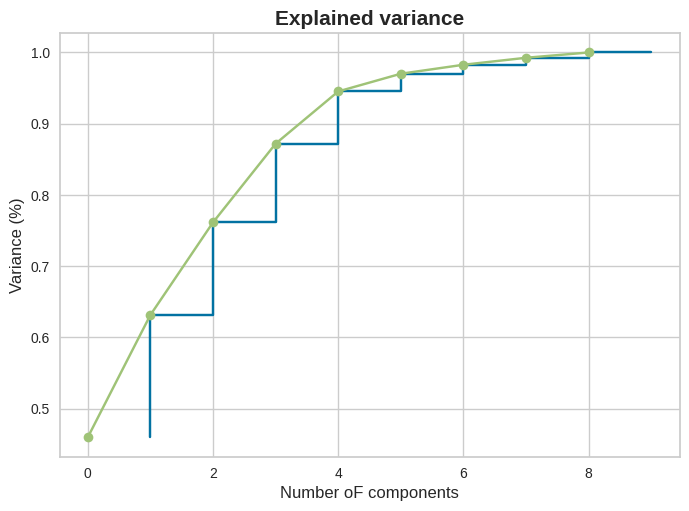

In [ ]:
# Pass through the scaled data set into our PCA class object
pca = PCA()
pca = pca.fit(scaled_df)
plt.figure(figsize=(10, 10))
plt.figure()
plt.step(list(range(1, 10)), np.cumsum(pca.explained_variance_ratio_))
plt.plot(np.cumsum(pca.explained_variance_ratio_), "go-")
plt.xlabel("Number oF components", fontsize=12)
plt.ylabel("Variance (%)", fontsize=12)
plt.title("Explained variance", fontsize=15, fontweight="bold")

# Show the plot
plt.show()

In [ ]:
# Now creat pca model with 4 components
pca = PCA(n_components=4) # we choise 4 componenets
pca.fit(scaled_df)
data_pca = pca.transform(scaled_df)
df_pca = pd.DataFrame(data_pca, columns=["PC1", "PC2", "PC3", "PC4"])
df_pca

,PC1,PC2,PC3,PC4
0,-2.913025,0.095621,-0.718118,1.005255
1,0.429911,-0.588156,-0.333486,-1.161059
2,-0.285225,-0.455174,1.221505,-0.868115
3,-2.932423,1.695555,1.525044,0.839625
4,1.033576,0.136659,-0.225721,-0.847063
...,...,...,...,...
162,-0.820631,0.639570,-0.389923,-0.706595
163,-0.551036,-1.233886,3.101350,-0.115311
164,0.498524,1.390744,-0.238526,-1.074098
165,-1.887451,-0.109453,1.109752,0.056257


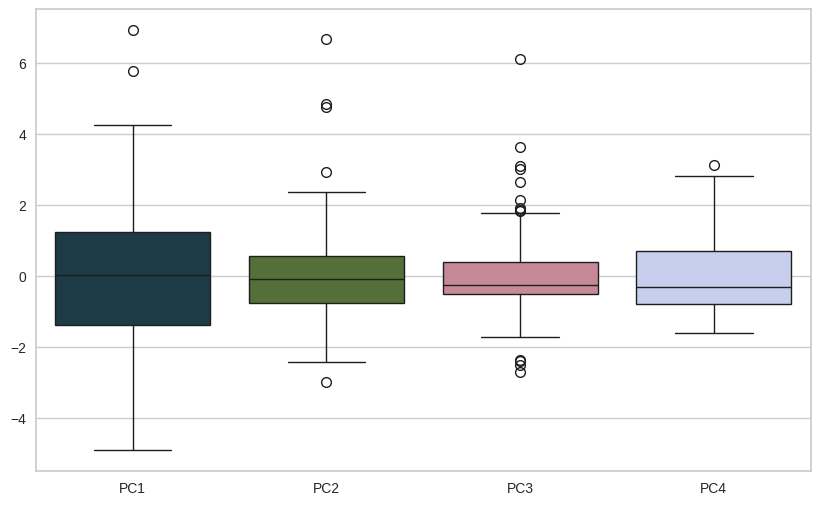

In [ ]:
# Box plot
fig = plt.figure(figsize=(10,6))
sns.boxplot(data=df_pca, palette="cubehelix")
plt.show()

In [ ]:
kmeans_set = {"init":"random", "n_init":10, "max_iter":300, "random_state":42}

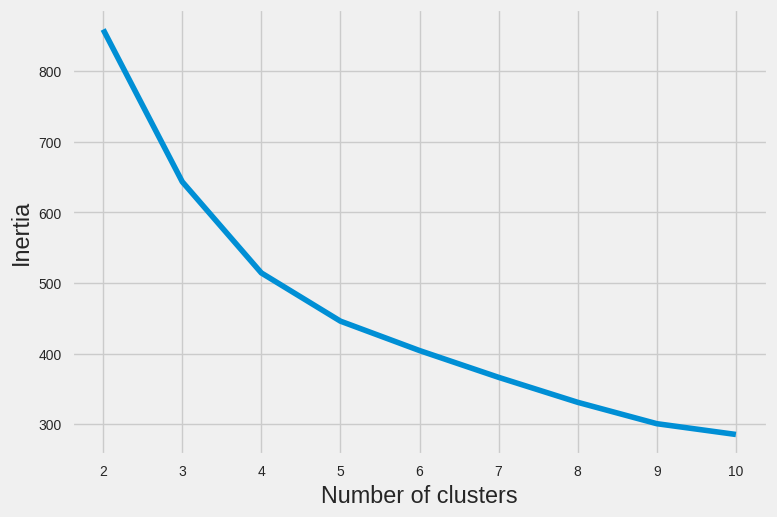

In [ ]:
# Find the number of clusters on df_pca
inertia = []
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, **kmeans_set) # ** is for open the dictionary
    kmeans.fit(df_pca)
    inertia.append(kmeans.inertia_)

plt.style.use("fivethirtyeight")
plt.plot(range(2, 11), inertia )
plt.xticks(range(2, 11))
plt.xlabel("Number of clusters")
plt.ylabel("Inertia")
plt.show()

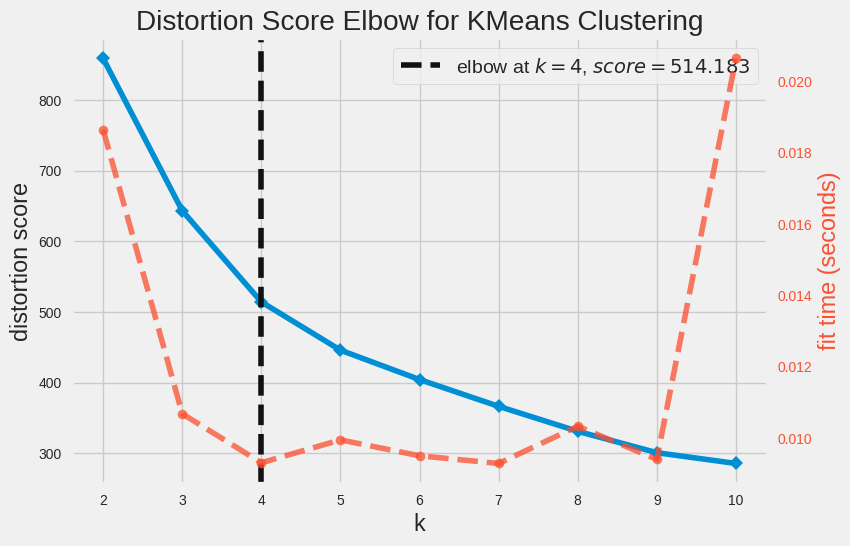

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [ ]:
# Elbow Method on df_pca
model_pca_df = KMeans(n_clusters=k, **kmeans_set)
visualizer = KElbowVisualizer(model_pca_df, k=(2, 11), timings=True)
visualizer.fit(df_pca)
visualizer.show()

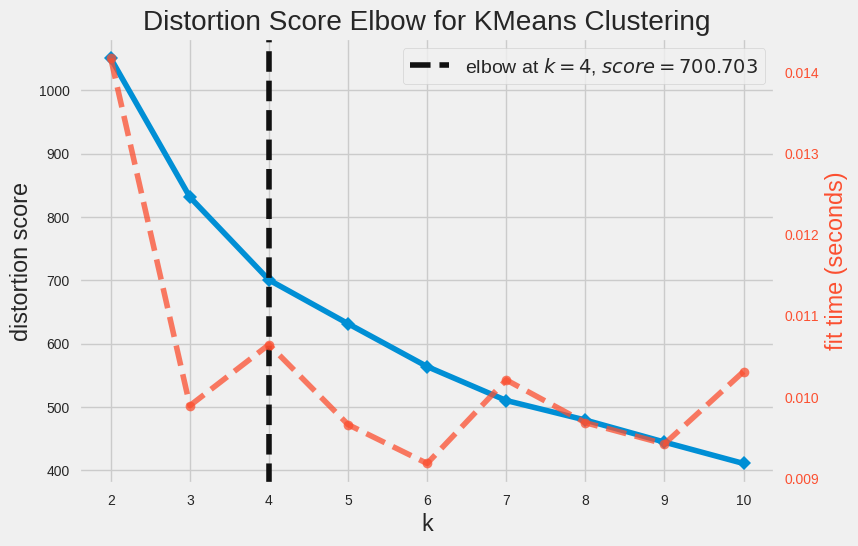

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [ ]:
# Elbow Method on scaled data
model_scaled_df = KMeans(n_clusters=k, **kmeans_set)
visualizer = KElbowVisualizer(model_scaled_df, k=(2, 11), timings=True)
visualizer.fit(scaled_df)
visualizer.show()

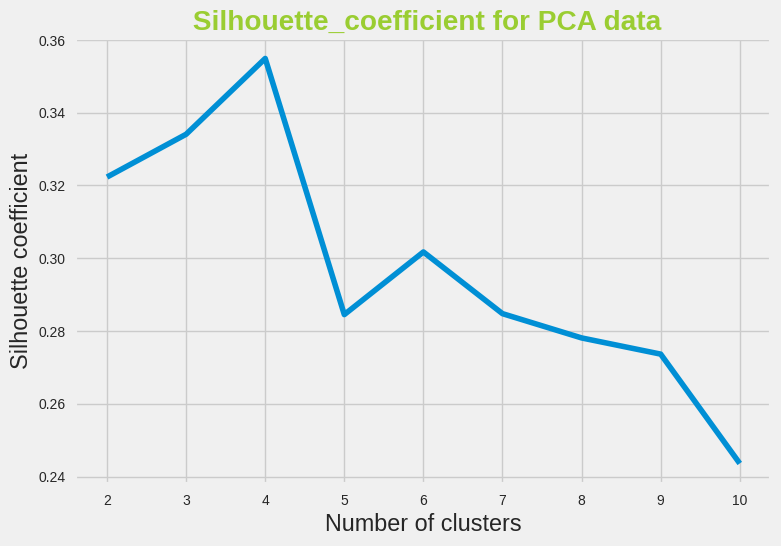

In [ ]:
# Silhouette_coefficient for PCA data
silhouette_coefficient = []
for k in range(2, 11): # start k from 2. one is not good.
    kmeans = KMeans(n_clusters=k, **kmeans_set)
    kmeans.fit(df_pca)
    score = silhouette_score(df_pca, kmeans.labels_)
    silhouette_coefficient.append(score)

plt.style.use("fivethirtyeight")
plt.plot(range(2, 11), silhouette_coefficient)
plt.xticks(range(2, 11))
plt.xlabel("Number of clusters")
plt.ylabel("Silhouette coefficient")
plt.title(" Silhouette_coefficient for PCA data", color="YellowGreen", fontweight="bold")
plt.show()

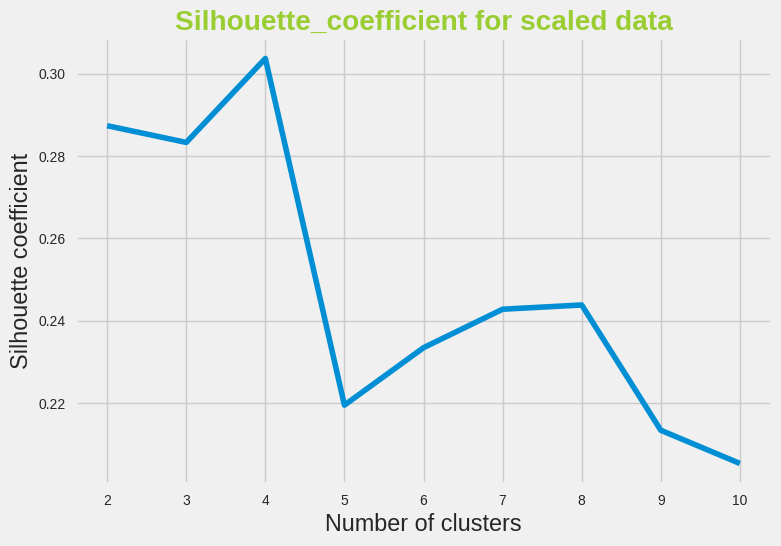

In [ ]:
# Silhouette_coefficient for scaled data
silhouette_coefficient = []
for k in range(2, 11): # start k from 2. one is not good.
    kmeans = KMeans(n_clusters=k, **kmeans_set)
    kmeans.fit(scaled_df)
    score = silhouette_score(scaled_df, kmeans.labels_)
    silhouette_coefficient.append(score)

plt.style.use("fivethirtyeight")
plt.plot(range(2, 11), silhouette_coefficient)
plt.xticks(range(2, 11))
plt.xlabel("Number of clusters")
plt.ylabel("Silhouette coefficient")
plt.title("Silhouette_coefficient for scaled data", color="YellowGreen", fontweight="bold")
plt.show()

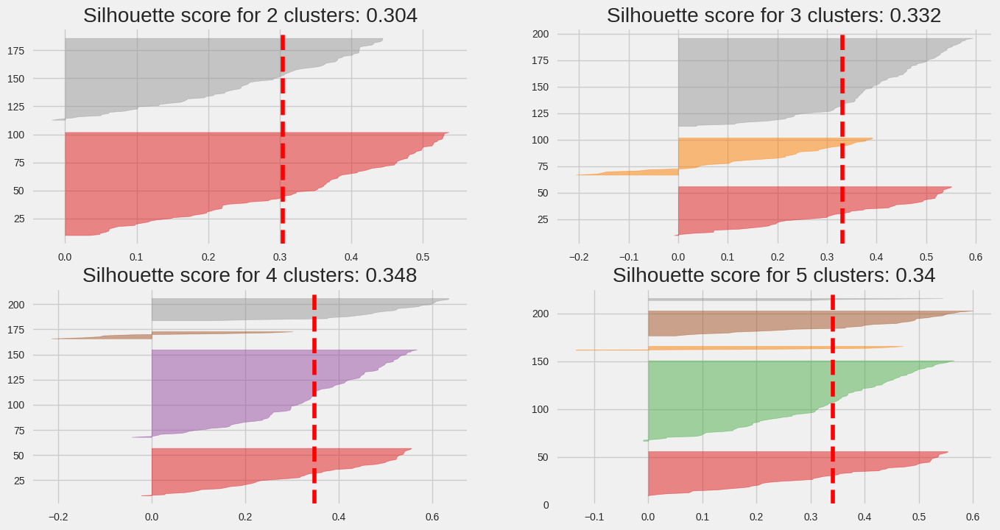

In [ ]:
# Silhouette scores of PCA data
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 8))
ax = [ax1, ax2, ax3, ax4]

for i in range(2, 6):
    kmeans = KMeans(n_clusters=i)
    silho_vis = SilhouetteVisualizer(kmeans, ax=ax[i-2])
    silho_vis.fit(df_pca)
    txt = "Silhouette score for " + str(i) + " clusters: "+ str(round(sil_score(df_pca, kmeans.labels_), 3))
    ax[i-2].set_title(txt)

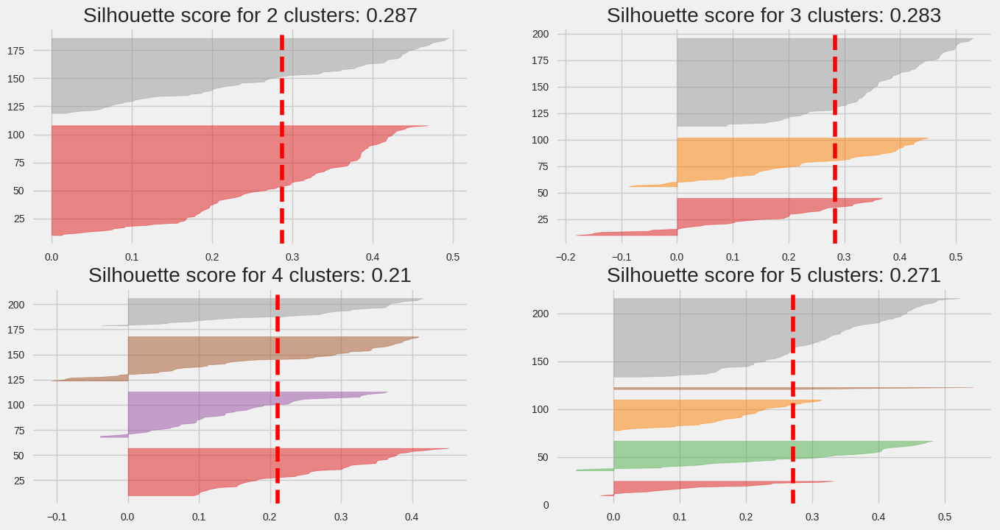

In [ ]:
# Silhouette scores of scaled data
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15,8))
ax = [ax1, ax2, ax3, ax4]

for i in range(2, 6):
    kmeans = KMeans(n_clusters=i)
    silho_vis = SilhouetteVisualizer(kmeans, ax=ax[i-2])
    silho_vis.fit(scaled_df)
    txt = "Silhouette score for " + str(i) + " clusters: "+ str(round(sil_score(scaled_df, kmeans.labels_), 3))
    ax[i-2].set_title(txt)

In [ ]:
# Creat a model with 4 clusters
kmeans = KMeans(n_clusters=4, **kmeans_set)
kmeans.fit(df_pca)
pred_kmeans = kmeans.labels_
centroids = kmeans.cluster_centers_
centroid_df = pd.DataFrame(centroids, columns=df_pca.columns)
centroid_df

,PC1,PC2,PC3,PC4
0,-2.400695,0.429863,-0.119772,0.676417
1,0.266593,-0.130548,0.034515,-0.748682
2,5.460225,5.432473,0.211648,0.906058
3,2.608934,-0.881836,0.072803,1.032730


In [ ]:
# Create a copy of the PCA-transformed data with predicted cluster labels
df_pca_copy = df_pca.copy()
df_pca_copy["KMeans_Pred"] = pred_kmeans  # Add a new column containing the predicted cluster labels
df_pca_copy

,PC1,PC2,PC3,PC4,KMeans_Pred
0,-2.913025,0.095621,-0.718118,1.005255,0
1,0.429911,-0.588156,-0.333486,-1.161059,1
2,-0.285225,-0.455174,1.221505,-0.868115,1
3,-2.932423,1.695555,1.525044,0.839625,0
4,1.033576,0.136659,-0.225721,-0.847063,1
...,...,...,...,...,...
162,-0.820631,0.639570,-0.389923,-0.706595,1
163,-0.551036,-1.233886,3.101350,-0.115311,1
164,0.498524,1.390744,-0.238526,-1.074098,1
165,-1.887451,-0.109453,1.109752,0.056257,0


In [ ]:
df_pca_count = pd.DataFrame({"Cluster":df_pca_copy["KMeans_Pred"].value_counts().index,
                             "Count":df_pca_copy["KMeans_Pred"].value_counts().values})

plt = px.pie(df_pca_count, values="Count", names="Cluster", title="Percent of each clusters in dataset",
             color_discrete_sequence=px.colors.sequential.Plasma)
plt.show()

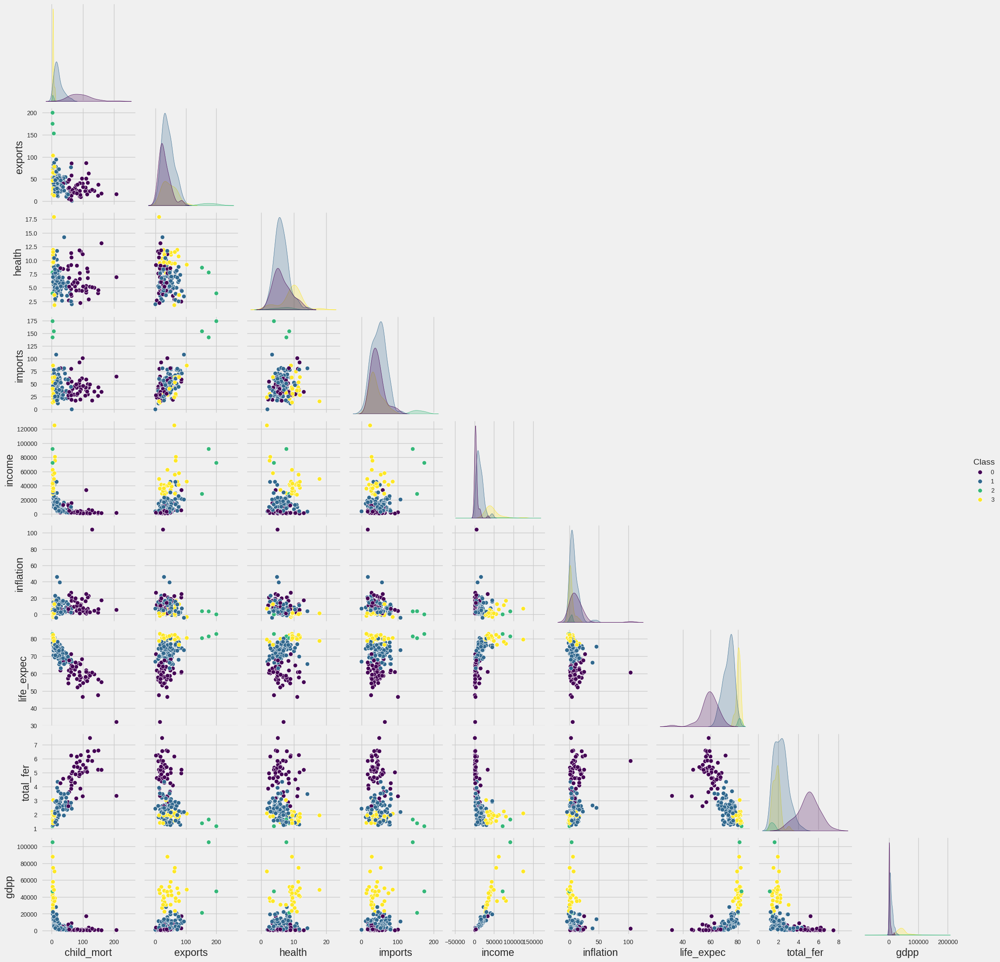

In [ ]:
kmeans_data = df1.copy()
kmeans_data["Class"] = pred_kmeans
sns.pairplot(kmeans_data, hue="Class", corner=True, palette="viridis")

In [ ]:
kmeans_data

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,Class
0,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553,0
1,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090,1
2,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460,1
3,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530,0
4,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200,1
...,...,...,...,...,...,...,...,...,...,...
162,29.2,46.6,5.25,52.7,2950,2.62,63.0,3.50,2970,1
163,17.1,28.5,4.91,17.6,16500,45.90,75.4,2.47,13500,1
164,23.3,72.0,6.84,80.2,4490,12.10,73.1,1.95,1310,1
165,56.3,30.0,5.18,34.4,4480,23.60,67.5,4.67,1310,0


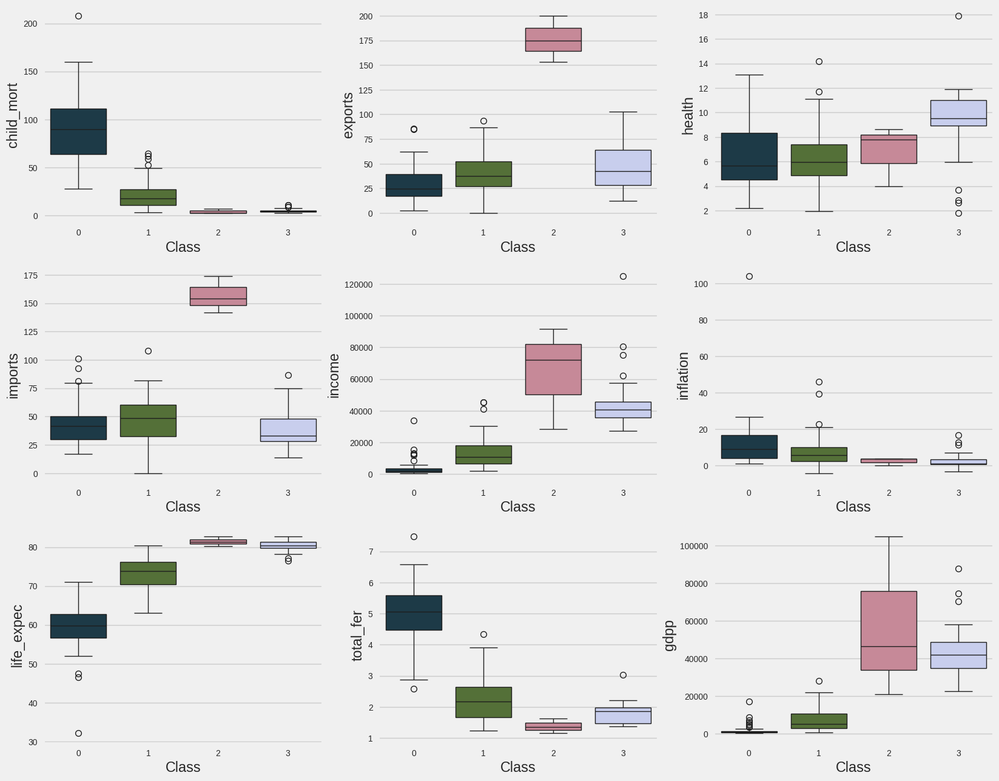

In [ ]:
import matplotlib.pyplot as plt
fig, (ax1, ax2, ax3) = plt.subplots(3, 3, figsize=(18, 15))
ax = [ax1, ax2, ax3]
j, k = 0, 0
for i in kmeans_data.drop(columns="Class").columns:
    sns.boxplot(x="Class", y=i, data=kmeans_data, ax=ax[j][k], palette="cubehelix")
    if divmod(k,2) == (1, 0):
        j += 1
        k = 0
    else: k += 1
plt.show()

In [ ]:
print(kmeans_data.Class.value_counts())
kmeans_data.groupby("Class").mean()

Class
1    87
0    48
3    29
2     3
Name: count, dtype: int64


,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
Class,,,,,,,,,
0,91.610417,29.571042,6.433542,43.133333,3897.354167,11.911146,59.239583,4.992083,1909.208333
1,21.113793,41.291828,6.217241,47.636390,13297.586207,7.371506,73.147126,2.251954,7158.298851
2,4.133333,176.000000,6.793333,156.666667,64033.333333,2.468000,81.433333,1.380000,57566.666667
3,4.982759,45.703448,9.245862,39.513793,45762.068966,2.727793,80.386207,1.814828,44065.517241


In [ ]:
priority = kmeans_data.Class.value_counts()
kmeans_data.Class[kmeans_data.Class==priority.index[0]]=44  #  Don't need help
kmeans_data.Class[kmeans_data.Class==priority.index[1]]=11  #  Need help
kmeans_data.Class[kmeans_data.Class==priority.index[2]]=33  #  Don't need immediate help
kmeans_data.Class[kmeans_data.Class==priority.index[3]]=22 #  Maybe need help

kmeans_data.Class.replace({11:1,22:2, 33:3, 44:4}, inplace=True)
kmeans_data.rename(columns={"Class": "Priority"}, inplace=True)
kmeans_data.Priority.value_counts()

,count
Priority,
4,87
1,48
3,29
2,3


In [ ]:
category = {1:"Undeveloped", 2:"Developing", 3:"Developed", 4:"Well_developed"}
kmeans_data["country"] = df["country"]
kmeans_data.Priority.replace(category, inplace=True)

In [ ]:
px.choropleth(data_frame=kmeans_data, locationmode="country names", locations="country",
              color=kmeans_data["Priority"], title="Countries by category that need help",
              color_discrete_map={"Undeveloped":"#a1c9f4", "Developing":"#8de5a1",
                                  "Developed":"#ff9f9b", "Well developed":"#d0bbff"},
              projection="equirectangular")

In [ ]:
px.choropleth(data_frame=kmeans_data, locationmode="country names", locations="country",
             color = kmeans_data.Priority, title="Countries in African continent",
             color_discrete_map={"Undeveloped":"#a1c9f4", "Developing":"#8de5a1",
                                  "Developed":"#ff9f9b", "Well developed":"#d0bbff"},
             projection="orthographic", scope="africa")

In [ ]:
px.choropleth(data_frame=kmeans_data, locationmode="country names", locations="country",
             color=kmeans_data.Priority, title="Countries in Asia continent",
             color_discrete_map={"Undeveloped":"#a1c9f4", "Developing":"#8de5a1",
                                  "Developed":"#ff9f9b", "Well developed":"#d0bbff"},
             scope="asia")

In [ ]:
df["Class"] = kmeans_data.Priority
count_need_help = df[df.Class == "Undeveloped"]
count_need_help.country

,country
0,Afghanistan
3,Angola
17,Benin
21,Botswana
25,Burkina Faso
26,Burundi
28,Cameroon
31,Central African Republic
32,Chad
36,Comoros


In [ ]:
fig = px.bar(count_need_help, x="child_mort", y="country", orientation="h")
fig.show()

In [ ]:
fig = px.bar(count_need_help, x="gdpp", y="country", orientation="h")
fig.show()

In [ ]:
fig = px.bar(count_need_help, x="inflation", y="country", orientation="h")
fig.show()

In [ ]:
fig = px.bar(count_need_help, x="life_expec", y="country", orientation="h")
fig.show()

In [ ]:
for i in count_need_help.drop(columns=["country", "Class"]).columns:
    fig = px.choropleth(data_frame=count_need_help, locationmode="country names",
           locations="country",projection="orthographic", height=600, color=i, title=f"{i} rate by countries")
    fig.show()